In [8]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/company/consumer_complaints.csv


In [2]:
!pip install pyspark==3.3.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.4/281.4 MB 6.1 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 kB 6.8 MB/s eta 0:00:00
  Created wheel for pyspark: filename=pyspark-3.3.2-py2.py3-none-any.whl size=281824009 sha256=0c78cfb7eb68115eb778e7f32e77447ce1c55bedb2a27df627091680404a2c02
  Stored in directory: /root/.cache/pip/wheels/47/69/84/c7c7776e2287a654536f5cba7dc54c904c03aa2c3e29206f0f
Successfully built pyspark
  Attempting uninstall: py4j
    Found existing installation: py4j 0.10.9.7
    Uninstalling py4j-0.10.9.7:
      Successfully uninstalled py4j-0.10.9.7
  Attempting uninstall: pyspark
    Found existing installation: pyspark 3.5.1
    Uninstalling pyspark-3.5.1:
      Successfully uninstalled pyspark-3.5.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dataproc-s

In [9]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import year, col


# Initialize Spark
spark = SparkSession.builder \
    .appName("ComplaintsInsightsDF") \
    .master("local[*]") \
    .getOrCreate()

# Path to Example.csv in Kaggle input directory
csv_path = "/kaggle/input/company/consumer_complaints.csv"

# Load CSV into DataFrame
df = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv(csv_path)

# Add a year column parsed from date_sent_to_company
df = df.withColumn("year", year(col("date_sent_to_company")))

# List of fields for insights
def insights_columns():
    return [
        "product",
        "sub_product",
        "issue",
        "company",
        "state",
        "company_response_to_consumer",
        "timely_response",
        "consumer_disputed?",
        "year"
    ]

# Compute and display top 10 for each field
def show_top(df, column, top_n=10):
    print(f"=== Top {top_n} {column.replace('_', ' ').title()} ===")
    df.groupBy(column) \
      .count() \
      .orderBy(col("count").desc()) \
      .show(top_n, truncate=False)

for col_name in insights_columns():
    show_top(df, col_name)

spark.stop()


=== Top 10 Product ===


+-----------------------+------+
|product                |count |
+-----------------------+------+
|Mortgage               |186475|
|Debt collection        |101052|
|Credit reporting       |91854 |
|null                   |70776 |
|Credit card            |66468 |
|Bank account or service|62563 |
|Consumer Loan          |20990 |
|Student loan           |15839 |
| Inc."                 |12524 |
| LLC"                  |4058  |
+-----------------------+------+
only showing top 10 rows

=== Top 10 Sub Product ===


+--------------------------------------+------+
|sub_product                           |count |
+--------------------------------------+------+
|null                                  |243434|
|Other mortgage                        |74319 |
|Conventional fixed mortgage           |57182 |
|Checking account                      |44369 |
|Other (i.e. phone, health club, etc.) |29617 |
|I do not know                         |21634 |
|Conventional adjustable mortgage (ARM)|20941 |
|Credit card                           |20825 |
|FHA mortgage                          |19152 |
|Non-federal student loan              |17969 |
+--------------------------------------+------+
only showing top 10 rows

=== Top 10 Issue ===


+----------------------------------------+-----+
|issue                                   |count|
+----------------------------------------+-----+
|Loan modification,collection,foreclosure|97191|
|null                                    |93833|
|Incorrect information on credit report  |66718|
|Loan servicing, payments, escrow account|60375|
|Cont'd attempts collect debt not owed   |42285|
|Account opening, closing, or management |26661|
|Communication tactics                   |18293|
|Disclosure verification of debt         |18292|
|Deposits and withdrawals                |17195|
|Application, originator, mortgage broker|13306|
+----------------------------------------+-----+
only showing top 10 rows

=== Top 10 Company ===


+--------------------------------------+------+
|company                               |count |
+--------------------------------------+------+
|null                                  |167276|
|Bank of America                       |52508 |
|Wells Fargo & Company                 |38956 |
|JPMorgan Chase & Co.                  |31310 |
|Equifax                               |27649 |
|Experian                              |26981 |
|Citibank                              |22761 |
|TransUnion Intermediate Holdings, Inc.|21677 |
|Ocwen                                 |19367 |
|Capital One                           |14130 |
+--------------------------------------+------+
only showing top 10 rows

=== Top 10 State ===


+-----+------+
|state|count |
+-----+------+
|null |174207|
|CA   |71747 |
|FL   |47734 |
|TX   |35672 |
|NY   |34458 |
|GA   |21446 |
|NJ   |20054 |
|PA   |17666 |
|IL   |17227 |
|VA   |15962 |
+-----+------+
only showing top 10 rows

=== Top 10 Company Response To Consumer ===


+-------------------------------+------+
|company_response_to_consumer   |count |
+-------------------------------+------+
|Closed with explanation        |353556|
|null                           |195657|
|Closed with non-monetary relief|61657 |
|Closed with monetary relief    |33305 |
|Closed without relief          |17909 |
|Closed                         |11643 |
|Closed with relief             |5305  |
|In progress                    |3763  |
|Untimely response              |2261  |
| XXXX                          |31    |
+-------------------------------+------+
only showing top 10 rows

=== Top 10 Timely Response ===


+-------------------------------------------------------------------------------------------------------------------------------------+------+
|timely_response                                                                                                                      |count |
+-------------------------------------------------------------------------------------------------------------------------------------+------+
|Yes                                                                                                                                  |477509|
|null                                                                                                                                 |195978|
|No                                                                                                                                   |11899 |
| XXXX                                                                                                                                |31    |

+--------------------------------------------------------------------------+------+
|consumer_disputed?                                                        |count |
+--------------------------------------------------------------------------+------+
|No                                                                        |392780|
|null                                                                      |196231|
|Yes                                                                       |96627 |
| XXXX                                                                     |26    |
|Closed with explanation                                                   |7     |
| XXXX XXXX                                                                |7     |
|Web                                                                       |7     |
| however                                                                  |5     |
|Consent provided                                                          |

+-------+------+
|year   |count |
+-------+------+
|null   |686833|
|2015   |3     |
|2016   |2     |
|1308151|1     |
|1309063|1     |
|1294143|1     |
|1420361|1     |
|1434452|1     |
|1306788|1     |
|1444456|1     |
+-------+------+
only showing top 10 rows



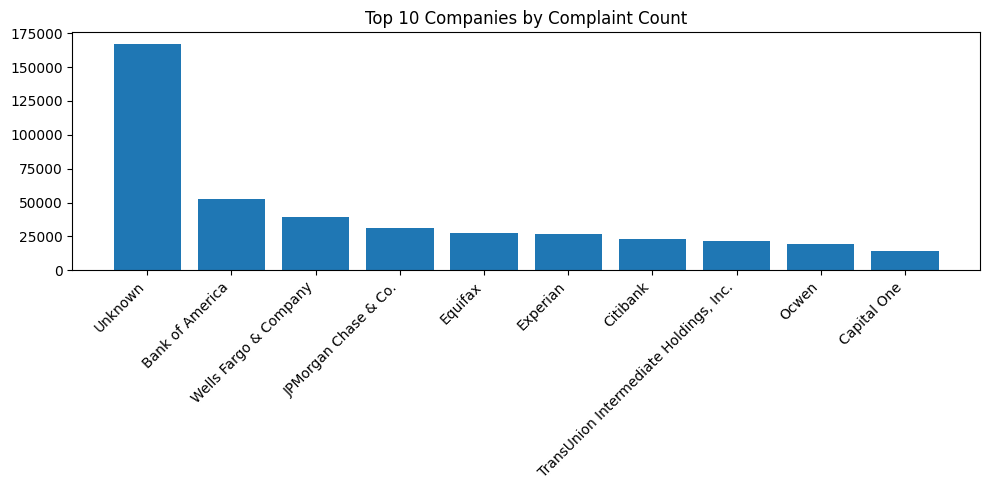

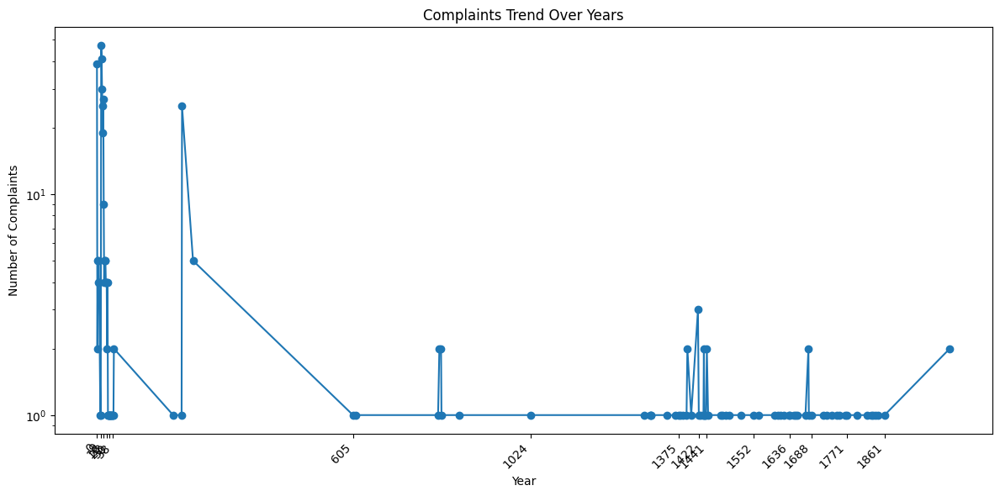

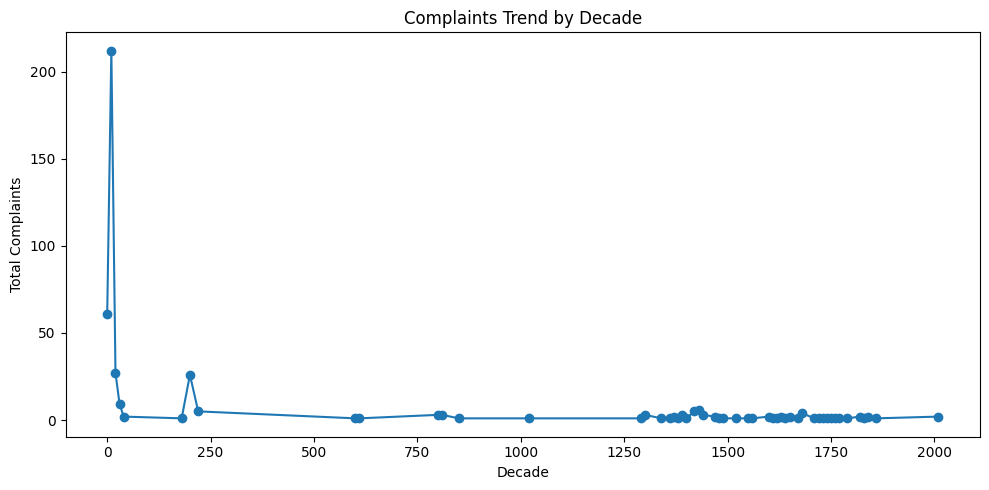

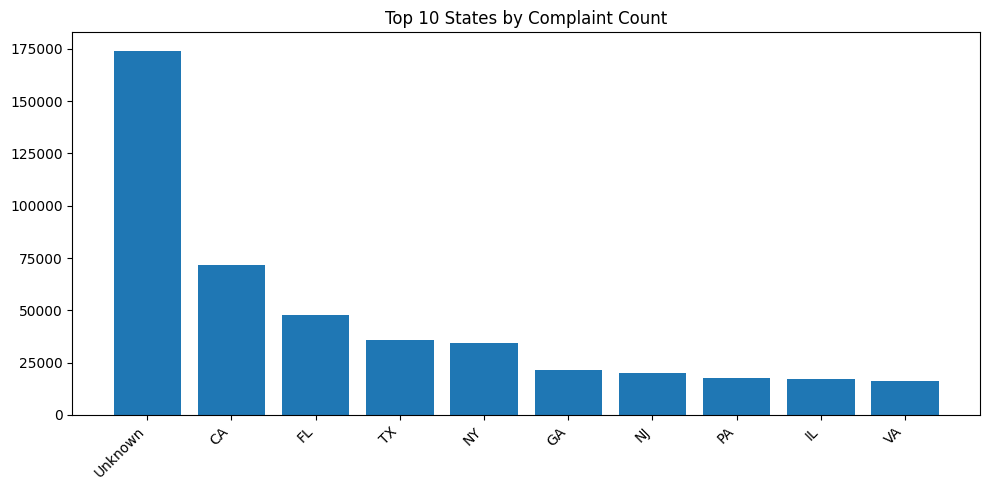

/tmp/ipykernel_36/2081343963.py:105: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


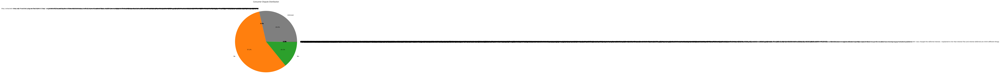

In [15]:
from pyspark.sql import SparkSession, functions as F
import matplotlib.pyplot as plt

# Initialize Spark session
spark = SparkSession.builder \
    .appName("ComplaintsVisualizations") \
    .master("local[*]") \
    .getOrCreate()

# Load CSV into DataFrame
csv_path = '/kaggle/input/company/consumer_complaints.csv'
df = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv(csv_path)

# Extract year from date_sent_to_company or date_received (first 4 characters)
df = df.withColumn(
    'year',
    F.substring(
        F.coalesce(F.col('date_sent_to_company'), F.col('date_received')),
        1, 4
    ).cast('int')
)

# 1. Top 10 Companies by Number of Complaints
company_counts = (
    df.groupBy("company")
      .count()
      .orderBy(F.desc("count"))
      .limit(10)
)
pdf_company = company_counts.toPandas()
pdf_company['company'] = pdf_company['company'].fillna('Unknown').astype(str)

plt.figure(figsize=(10,5))
plt.bar(pdf_company['company'], pdf_company['count'])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Companies by Complaint Count')
plt.tight_layout()
plt.show()

# 2. Complaints Trend Over Years (filter non-null years)
year_counts = (
    df.filter(F.col('year').isNotNull())
      .groupBy('year')
      .count()
      .orderBy('year')
)
pdf_year = year_counts.toPandas().sort_values('year')
years = pdf_year['year'].astype(int).tolist()
counts = pdf_year['count'].tolist()
# Determine tick step for readability (max 15 ticks)
tick_step = max(1, len(years) // 15)

plt.figure(figsize=(12,6))
plt.plot(years, counts, marker='o')
plt.title('Complaints Trend Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Complaints')
plt.yscale('log')  # Use log scale to handle large variations
plt.xticks(years[::tick_step], rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Optional: Aggregate by decade to smooth trend
decade_df = pdf_year.copy()
decade_df['decade'] = (decade_df['year'] // 10) * 10
decade_counts = decade_df.groupby('decade')['count'].sum().reset_index()

plt.figure(figsize=(10,5))
plt.plot(decade_counts['decade'], decade_counts['count'], marker='o')
plt.title('Complaints Trend by Decade')
plt.xlabel('Decade')
plt.ylabel('Total Complaints')
plt.tight_layout()
plt.show()

# 3. Top 10 States by Number of Complaints
state_counts = (
    df.groupBy('state')
      .count()
      .orderBy(F.desc('count'))
      .limit(10)
)
pdf_state = state_counts.toPandas()
pdf_state['state'] = pdf_state['state'].fillna('Unknown').astype(str)

plt.figure(figsize=(10,5))
plt.bar(pdf_state['state'], pdf_state['count'])
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 States by Complaint Count')
plt.tight_layout()
plt.show()

# 4. Consumer Dispute Distribution
# Use column name from CSV if present, else fallback to default
dispute_col = 'consumer_disputed?' if 'consumer_disputed?' in df.columns else 'consumer_disputed'
dispute_counts = df.groupBy(dispute_col).count().toPandas()
dispute_counts[dispute_col] = dispute_counts[dispute_col].fillna('Unknown').astype(str)

plt.figure(figsize=(20,10))
plt.pie(dispute_counts['count'], labels=dispute_counts[dispute_col], autopct='%1.1f%%')
plt.title('Consumer Dispute Distribution')
plt.tight_layout()
plt.show()

# Stop Spark session
spark.stop()


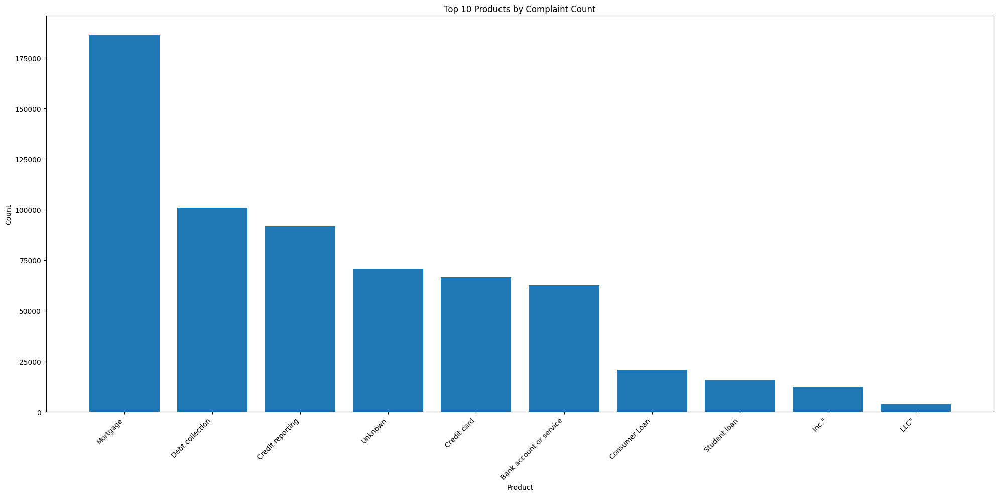

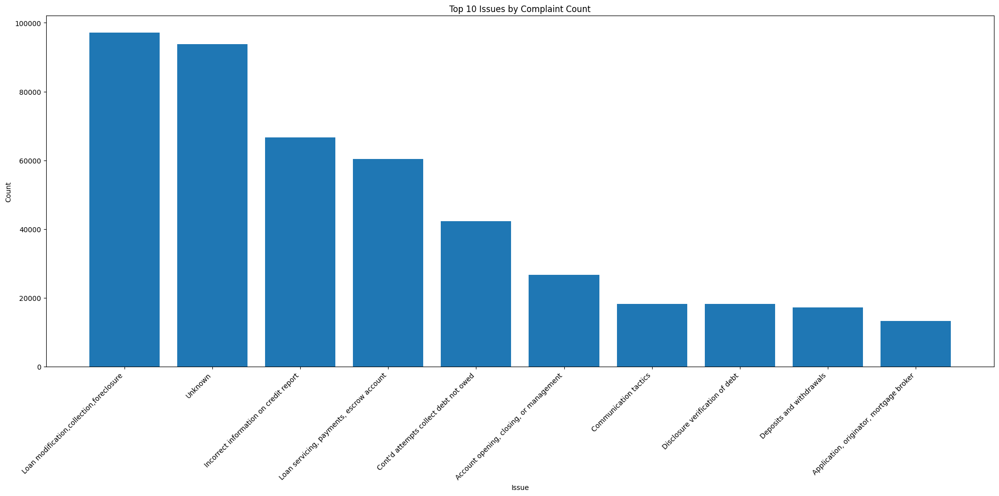

/tmp/ipykernel_36/2857164038.py:35: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


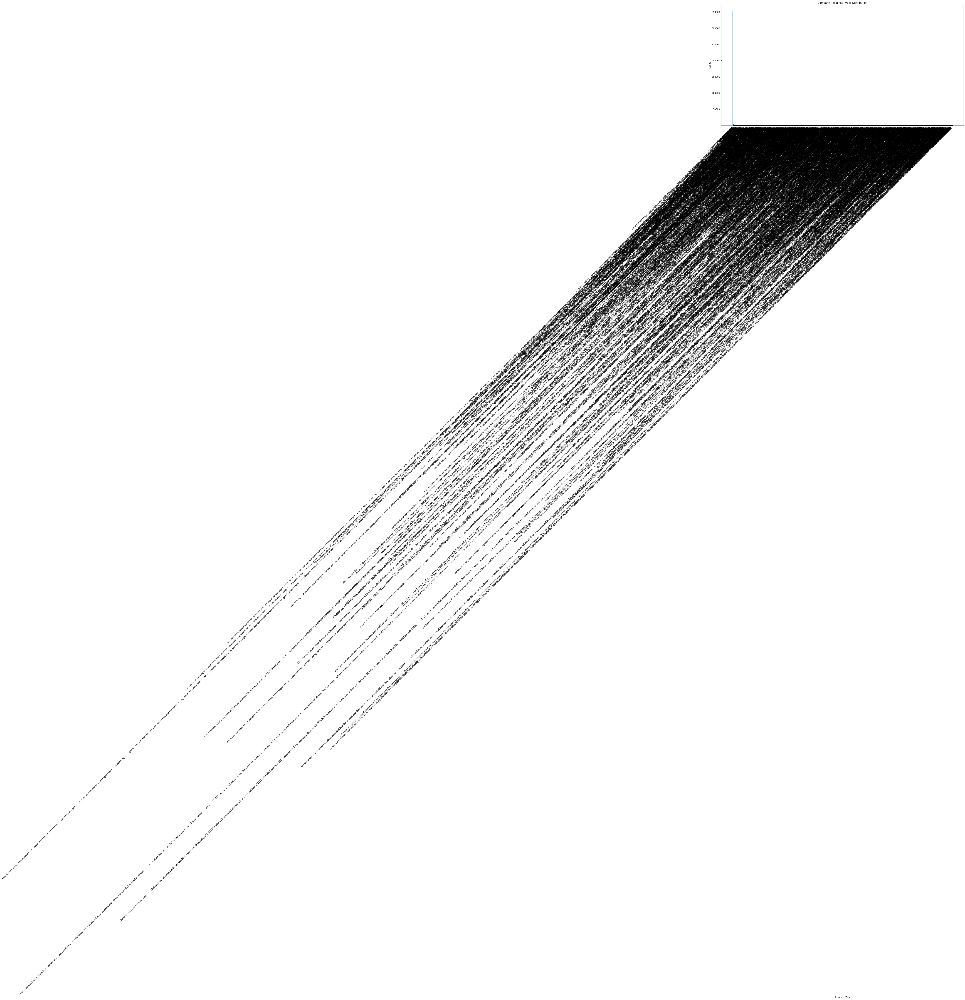

ValueError: 
 but they ca n't loan /me the $ $ until XX/XX/XXXX as I was forced to file ChXXXX for unpaid doctor bills
                              ^
ParseException: Expected end of text, found '$'  (at char 30), (line:1, col:31)

Error in callback <function _draw_all_if_interactive at 0x7b7f2c4bb100> (for post_execute):


ValueError: 
 but they ca n't loan /me the $ $ until XX/XX/XXXX as I was forced to file ChXXXX for unpaid doctor bills
                              ^
ParseException: Expected end of text, found '$'  (at char 30), (line:1, col:31)

ValueError: 
 but they ca n't loan /me the $ $ until XX/XX/XXXX as I was forced to file ChXXXX for unpaid doctor bills
                              ^
ParseException: Expected end of text, found '$'  (at char 30), (line:1, col:31)

<Figure size 2000x1000 with 1 Axes>

In [19]:
from pyspark.sql import SparkSession, functions as F
import matplotlib.pyplot as plt

# Separate Visualization Code (Sections 5-8)
# Initialize Spark session
spark = SparkSession.builder \
    .appName("ComplaintsVisualizations_5_to_8") \
    .master("local[*]") \
    .getOrCreate()

# Load CSV into DataFrame
df = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv('/kaggle/input/company/consumer_complaints.csv')

# Extract year from dates
df = df.withColumn(
    'year',
    F.substring(
        F.coalesce(F.col('date_sent_to_company'), F.col('date_received')),
        1, 4
    ).cast('int')
)

# Helper to plot bar charts
def plot_bar(x, y, title, xlabel=None, figsize=(20,10)):
    plt.figure(figsize=figsize)
    plt.bar(x, y)
    plt.xticks(rotation=45, ha='right')
    plt.title(title)
    if xlabel:
        plt.xlabel(xlabel)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

# 5. Top 10 Products by Complaint Count
prod_counts = df.groupBy('product').count().orderBy(F.desc('count')).limit(10)
pdf_p = prod_counts.toPandas()
pdf_p['product'] = pdf_p['product'].fillna('Unknown').astype(str)
plot_bar(pdf_p['product'], pdf_p['count'], 'Top 10 Products by Complaint Count', xlabel='Product')

# 6. Top 10 Issues by Complaint Count
issue_counts = df.groupBy('issue').count().orderBy(F.desc('count')).limit(10)
pdf_i = issue_counts.toPandas()
pdf_i['issue'] = pdf_i['issue'].fillna('Unknown').astype(str)
plot_bar(pdf_i['issue'], pdf_i['count'], 'Top 10 Issues by Complaint Count', xlabel='Issue')


# Stop Spark session
spark.stop()


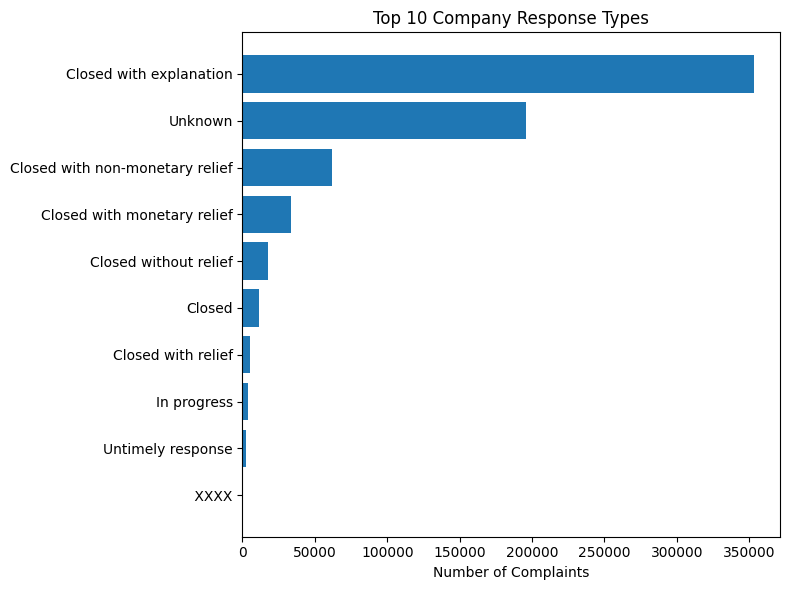

In [21]:
from pyspark.sql import SparkSession, functions as F
import matplotlib.pyplot as plt

# Standalone Visualization: Top Company Response Types
# Initialize Spark session
spark = SparkSession.builder \
    .appName("CompanyResponseDistribution") \
    .master("local[*]") \
    .getOrCreate()

# Load dataset
df = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv('/kaggle/input/company/consumer_complaints.csv')

# Compute complaint counts by response type
df_counts = df.groupBy('company_response_to_consumer') \
    .count()

# Convert to pandas for plotting
pdf = df_counts.toPandas()
pdf['company_response_to_consumer'] = \
    pdf['company_response_to_consumer'].fillna('Unknown').astype(str)

# Sort and select top 10 response categories
pdf_top = pdf.sort_values(by='count', ascending=False).head(10)

# Plot horizontal bar chart
plt.figure(figsize=(8, 6))
plt.barh(
    pdf_top['company_response_to_consumer'],
    pdf_top['count']
)
plt.xlabel('Number of Complaints')
plt.title('Top 10 Company Response Types')
plt.gca().invert_yaxis()  # Highest on top
plt.tight_layout()
plt.show()

# Stop Spark session
spark.stop()


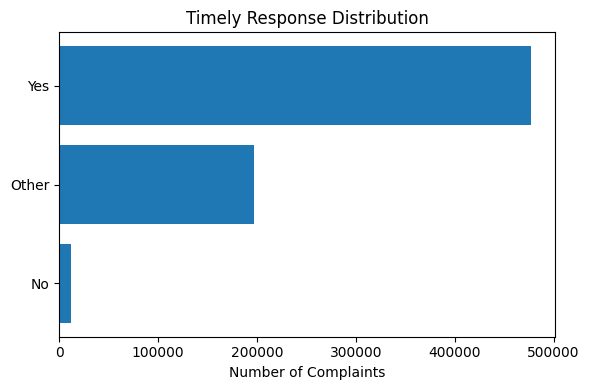

In [28]:
from pyspark.sql import SparkSession, functions as F
import pandas as pd
import matplotlib.pyplot as plt

# Standalone Visualization: Timely Response Distribution
spark = SparkSession.builder \
    .appName("TimelyResponseDistribution") \
    .master("local[*]") \
    .getOrCreate()

# Load dataset and compute timely response counts
# Updated CSV path for Kaggle input
df = spark.read \
    .option("header", "true") \
    .option("inferSchema", "true") \
    .csv('/kaggle/input/company/consumer_complaints.csv')

timely_df = df.groupBy('timely_response').count()
pdf_tr = timely_df.toPandas()

# Standardize and clean labels
pdf_tr['timely_response'] = (
    pdf_tr['timely_response']
    .fillna('Unknown')
    .astype(str)
    .str.strip()
    .str.title()
)

# Keep only Yes/No categories and aggregate others into 'Other'
pdf_yesno = pdf_tr[pdf_tr['timely_response'].isin(['Yes', 'No'])].copy()
other_count = pdf_tr[~pdf_tr['timely_response'].isin(['Yes', 'No'])]['count'].sum()
if other_count > 0:
    other_df = pd.DataFrame([{'timely_response': 'Other', 'count': other_count}])
    pdf_yesno = pd.concat([pdf_yesno, other_df], ignore_index=True)

# Sort for plotting
pdf_yesno = pdf_yesno.sort_values(by='count', ascending=False)

# Plot horizontal bar chart
plt.figure(figsize=(6, 4))
plt.barh(pdf_yesno['timely_response'], pdf_yesno['count'])
plt.xlabel('Number of Complaints')
plt.title('Timely Response Distribution')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Stop Spark session
spark.stop()
